In [1]:
%run common.ipynb

['LC_Type1', 'LST_Day_1km', 'pr', 'aet', 'NDVI', 'EVI']
['LST_Day_1km', 'pr', 'aet', 'NDVI', 'EVI']
['LC_Type1']


In [2]:
%run tuning_common.ipynb

Using TensorFlow backend


In [3]:
MODEL_SAVE_DIR = f'{MODEL_FOLDER}downstream-sgdregressor/model/'

In [4]:
downstream_train_df = pd.read_csv(f'{DATA_FOLDER}{DOWNSTREAM_TRAIN_FILENAME}')
downstream_test_df = pd.read_csv(f'{DATA_FOLDER}{DOWNSTREAM_TEST_FILENAME}')

In [5]:
downstream_train_df[CATEGORICAL_FEATURES] = downstream_train_df[CATEGORICAL_FEATURES].astype("category")
downstream_test_df[CATEGORICAL_FEATURES] = downstream_test_df[CATEGORICAL_FEATURES].astype("category")

In [6]:
from sklearn.linear_model import SGDRegressor 

In [14]:
import time
from sklearn.model_selection import RandomizedSearchCV

# loss='squared_error', *, penalty='l2', alpha=0.0001, l1_ratio=0.15, fit_intercept=True, max_iter=1000, tol=0.001, shuffle=True, verbose=0, epsilon=0.1, random_state=None, learning_rate='invscaling', eta0=0.01, power_t=0.25, early_stopping=False, validation_fraction=0.1, n_iter_no_change=5, warm_start=False, average=False

param_dist = {
    'loss':['squared_error', 'huber', 'epsilon_insensitive'],
    'penalty':['l2', 'l1', 'elasticnet'], 
    'alpha':[0.0001, 0.001, 0.01],  
    'eta0':[0.001, 0.01, 0.1],
}

model = SGDRegressor(verbose=1, n_iter_no_change=30, learning_rate='adaptive', early_stopping=True, validation_fraction=0.2, max_iter=5000, tol=10)

n_iter_search = 100
random_search = RandomizedSearchCV(
    model,
    param_distributions=param_dist,
    n_iter=n_iter_search,
    cv=5)
start = time.time()
random_search.fit(downstream_train_df[FEATURES], downstream_train_df[TARGET_FEATURE])
print("RandomizedSearchCV took %.2f seconds for %d candidates"
      " parameter settings." % ((time.time() - start), n_iter_search))

/home/zheng.yant/.conda/envs/newTF_env/lib/python3.9/site-packages/sklearn/model_selection/_search.py:292: UserWarning: The total space of parameters 81 is smaller than n_iter=100. Running 81 iterations. For exhaustive searches, use GridSearchCV.
  warnings.warn(


-- Epoch 1
Norm: 3075.44, NNZs: 6, Bias: 1129.730154, T: 636, Avg. loss: 19278644.024268
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 3873.17, NNZs: 6, Bias: 1990.189405, T: 1272, Avg. loss: 13753900.961882
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 4027.19, NNZs: 6, Bias: 2676.320772, T: 1908, Avg. loss: 12422493.264958
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 4261.56, NNZs: 6, Bias: 3334.872935, T: 2544, Avg. loss: 11676793.179560
Total training time: 0.00 seconds.
-- Epoch 5
Norm: 4435.17, NNZs: 6, Bias: 3914.576668, T: 3180, Avg. loss: 10890036.058427
Total training time: 0.01 seconds.
-- Epoch 6
Norm: 4536.61, NNZs: 6, Bias: 4413.734352, T: 3816, Avg. loss: 10280451.476839
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 4690.51, NNZs: 6, Bias: 4913.268708, T: 4452, Avg. loss: 10057801.061599
Total training time: 0.01 seconds.
-- Epoch 8
Norm: 4742.58, NNZs: 6, Bias: 5350.675904, T: 5088, Avg. loss: 9557132.034295
Total training time: 0.01 seconds.
--

In [20]:
import pickle

best_regressor = random_search.best_estimator_
with open(f"{MODEL_SAVE_DIR}/model.pkl",'wb') as f:
    pickle.dump(best_regressor,f)

RMSE prediction: 4624.1805
RMSE MOD17: 4555.6241
R-Squared prediction: 0.48633585616341934
R-Squared MOD17: 0.5014537494606676
Max error prediction: 13526.71626776069
Max error MOD17: 15912.398000000001
predict_df contains negative values, skip mean_poisson_deviance metrics
Mean pinball loss with alpha = 0.9 prediction: 1902.3989400207174
Mean pinball loss with alpha = 0.9 MOD17: 2449.5122141973197
Mean pinball loss with alpha = 0.09999999999999998 prediction: 1614.5703986105013
Mean pinball loss with alpha = 0.09999999999999998 MOD17: 950.1839272686522


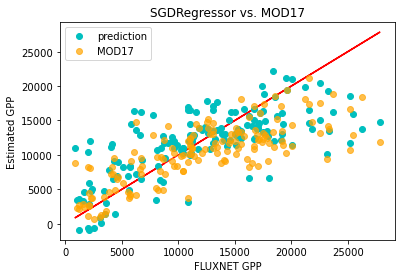

In [8]:
import pickle
from sklearn.metrics import mean_squared_error

with open(f"{MODEL_SAVE_DIR}/model.pkl", 'rb') as f:
    best_regressor = pickle.load(f)
y_pred = best_regressor.predict(downstream_test_df[FEATURES])
modis_compare_data = get_modis_compare_data(y_pred)
get_all_metrics(y_pred, modis_compare_data[TARGET_FEATURE], downstream_test_df[TARGET_FEATURE])
plot_result_distribution(downstream_test_df[TARGET_FEATURE], y_pred, modis_compare_data[TARGET_FEATURE], save_dir=f'{MODEL_RESULT_PLT_DIR}SGDRegressor.png', title='SGDRegressor vs. MOD17')